In [1]:
## Unzip the upload data into google drive.
# !unzip "/content/drive/MyDrive/Dog-Vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/Dog-Vision/"

# End-To-End Multi-class dog breed classification
In this project we are building end to end multiclass image classifier using tensorflow and tensorflow hub.

## Problems
Identifying the breed of a dog given an image of a dog.

When I am outside my house and I see some dog, I want to know what breed that dog is.

## Data
The data we are using is from kaggle.

## Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## Features
Some information about the data.
* We are dealing with images (unstructured data) so its probably we use deep learning/transfer leraning.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are 10K+ images for tranning set and 10K+ images for testing set.(These images do not have a label)

In [2]:
import tensorflow as tf
import tensorflow_hub as hub

print("TensorFlow:", tf.__version__)
print("TF Hub:", hub.__version__)
print("Keras (from TF):", tf.keras.__version__)


TensorFlow: 2.19.0
TF Hub: 0.16.1
Keras (from TF): 3.10.0


In [3]:
## Lets check which GPU we are using if its available.
print("GPU Available: " "Yes:))"if tf.config.list_physical_devices("GPU") else "not available")

not available


## Getting our data (Turning into tensors)
Lets start with accesing our data and checking it

In [4]:
import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/Dog-Vision/labels.csv")
label_csv.describe()


,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [5]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


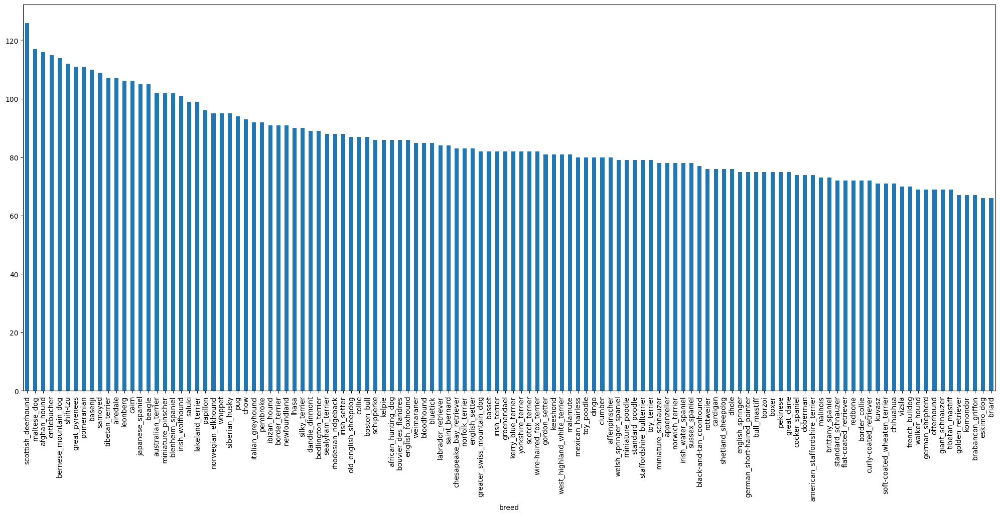

In [6]:
label_csv.breed.value_counts().plot.bar(figsize=(25,10));

In [7]:
label_csv.breed.value_counts().median()

82.0

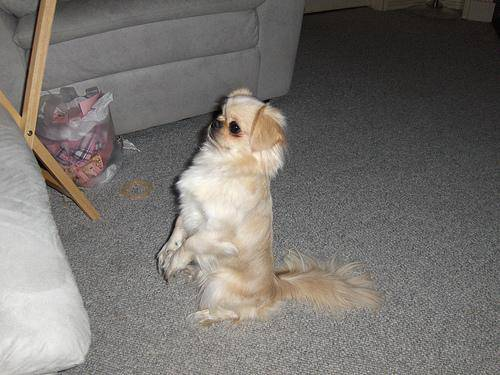

In [8]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

  # Let's get images and their labels.

In [9]:
filename = ["/content/drive/MyDrive/Dog-Vision/train/"+ fname+".jpg" for fname in label_csv.id]
filename[:10]

['/content/drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
## Let's check number of file names matches with actuall image or not.
import os
if len(os.listdir("/content/drive/MyDrive/Dog-Vision/train")) == len(filename):
  print("Filenames match")
else:
  print("file names do not match")

Filenames match


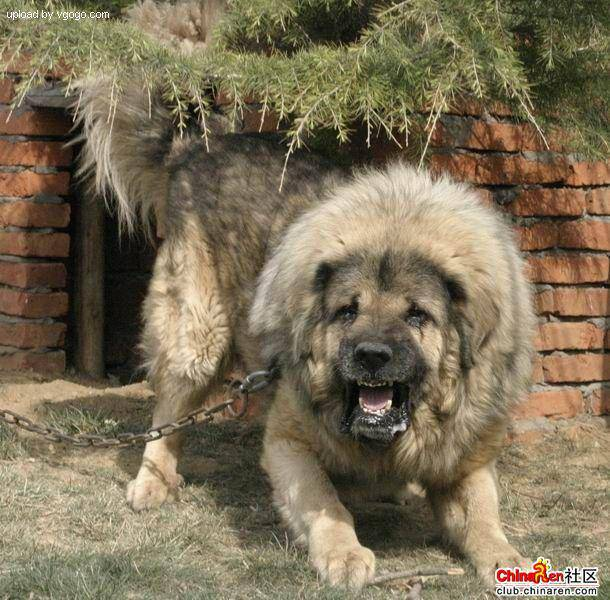

In [11]:
Image(filename[9000])

In [12]:
label_csv.breed[9000], label_csv

('tibetan_mastiff',
                                      id                     breed
 0      000bec180eb18c7604dcecc8fe0dba07               boston_bull
 1      001513dfcb2ffafc82cccf4d8bbaba97                     dingo
 2      001cdf01b096e06d78e9e5112d419397                  pekinese
 3      00214f311d5d2247d5dfe4fe24b2303d                  bluetick
 4      0021f9ceb3235effd7fcde7f7538ed62          golden_retriever
 ...                                 ...                       ...
 10217  ffd25009d635cfd16e793503ac5edef0                    borzoi
 10218  ffd3f636f7f379c51ba3648a9ff8254f            dandie_dinmont
 10219  ffe2ca6c940cddfee68fa3cc6c63213f                  airedale
 10220  ffe5f6d8e2bff356e9482a80a6e29aac        miniature_pinscher
 10221  fff43b07992508bc822f33d8ffd902ae  chesapeake_bay_retriever
 
 [10222 rows x 2 columns])

## Turning data labels into numbers

Since we have got our trainning images file path in list, lets prepare label.

In [13]:
import numpy as np
labels = label_csv.breed.to_numpy()
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [14]:
if len(labels) == len(filename):
  print("Numbers have matched")
else:
  print("Numbers do not match, please check the file directory.")

Numbers have matched


In [15]:
## Let's find the unique breeds
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds[:5]

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier'], dtype=object))

In [16]:
## lets turn single labels into boolean arrays
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
## Turning every label into boolean arrays
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
# Example of turning booleans arrays into numbers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [19]:
labels[2], boolean_labels[2].astype(int)

('pekinese',
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))

### Creating validation set

In [20]:
X = filename
Y = boolean_labels

In [21]:
len(filename)

10222

In [22]:
## Lets start with only 1000 images right now and later on we will increase it as we need. Its because ML or DL model could really take awhile to train 10,000 images.
NUM_IMGS = 5000 #@param{type:"slider", min:1000, max: 10000, step: 1000}

In [23]:
## Lets split our data into train and validation using sklearn's train test split
from sklearn.model_selection import train_test_split
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMGS], Y[:NUM_IMGS], test_size=0.2, random_state=42)

len(X_train), len(X_val)

(4000, 1000)

In [24]:
X_train[:2], Y_train[:2]

(['/content/drive/MyDrive/Dog-Vision/train/693f4cd00978df07e1283d3da4d02e0c.jpg',
  '/content/drive/MyDrive/Dog-Vision/train/7521421e092333c78d6b9dc2e189e659.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

## Preprocessing images (Turning images into tensors)
tensors are matrix, something like numeric representation

In [25]:
## lets see what importing image looks like
from matplotlib.pyplot import imread
image = imread(filename[7])
image.shape, image[:2]


((227, 231, 3),
 array([[[ 76,  97,  58],
         [ 80, 101,  62],
         [ 84, 104,  67],
         ...,
         [ 67,  82,  51],
         [ 67,  82,  51],
         [ 37,  52,  19]],
 
        [[ 91, 112,  73],
         [ 94, 115,  76],
         [ 93, 113,  76],
         ...,
         [ 89, 102,  74],
         [ 83,  96,  66],
         [ 71,  84,  54]]], dtype=uint8))

In [26]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 231, 3), dtype=uint8, numpy=
array([[[ 76,  97,  58],
        [ 80, 101,  62],
        [ 84, 104,  67],
        ...,
        [ 67,  82,  51],
        [ 67,  82,  51],
        [ 37,  52,  19]],

       [[ 91, 112,  73],
        [ 94, 115,  76],
        [ 93, 113,  76],
        ...,
        [ 89, 102,  74],
        [ 83,  96,  66],
        [ 71,  84,  54]]], dtype=uint8)>

In [27]:
IMG_SIZE = 224

def process_img(img_path):
    """
    1. Take an image file path as input.
    2. Use TensorFlow to read the file.
    3. Decode the image into a Tensor (RGB).
    4. Normalize pixel values to the range [0, 1].
    5. Resize the image to (224, 224).
    6. Return the modified image Tensor.
    """
    # Read the image file
    image = tf.io.read_file(img_path)

    # Decode JPEG image to tensor with 3 color channels (RGB)
    image = tf.io.decode_jpeg(image, channels=3)

    # Normalize pixel values from [0, 255] to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize the image to (224, 224)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])

    return image

## Turning our data into batches
we will be turning our data into batches, because if we use our whole 10K + data in one go, they might not fit into memory.

We are going to use 32(batch size) images at a time.

In order to use tensorflow we need our data in form of `(Image, label)`

In [28]:
## Lets create a simple function which will return tuple (image, label)
def get_image_label(image_path, label):
  """
  takes an image file path name and the associated label
  processes the image and return the tuple (image, label)
  """
  image = process_img(image_path)
  return (image, label)

In [29]:
(process_img(X[42]), tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

now we got the function which return the data into tuple of tensors in the form of (image, label), lets make a function to turn all our data (X & Y) into batches.

In [30]:
# batch size
BATCH_SIZE = 32

# # create a function to turn our data into batches.
# def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data= False, test_data=False):
#   """
#   create's batches of data out of image(X) and label(y) pairs.
#   Shuffles the data if its trainning data but dosent if its validation data.
#   Also accepts test data as input(no labels).
#   """

#   if test_data:
#     print("Creating test data batches...")
#     data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file paths no labels.
#     data_batch = data.map(process_img).batch(batch_size)
#     return data_batch

#   elif valid_data:
#     print("Creating a validation batches...")
#     data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepath
#                                                tf.constant(Y))) # labels
#     data_batch = data.map(get_image_label).batch(batch_size)
#     return data_batch

#   else:
#     print("Creating a trainning batches...")
#     data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepath
#                                                tf.constant(Y))) # labels

#     data = data.shuffle(buffer_size=len(X))
#     data_batch = data.map(get_image_label).batch(batch_size)
#     return data_batch
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
        data_batch = data.map(process_img, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch

    elif valid_data:
        print("Creating validation batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
        data_batch = data.map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch

    else:
        print("Creating training batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_label, num_parallel_calls=tf.data.AUTOTUNE).batch(batch_size).prefetch(tf.data.AUTOTUNE)
        return data_batch


In [31]:
training_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training batches...
Creating validation batches...


In [32]:
training_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [33]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

## Lets Visualize our data

In [34]:
# import matplotlib.pyplot as plt
# def show_25_imgs(images, label):
#   """
#   Display a plot of 25 images with their labels
#   """

#   # setup the figure
#   plt.figure(figsize=(10,10))

#   for i in range (25):
#     # create subplots (5 rows, 5 coloums)
#     ax = plt.subplot(5,5, i+1)

#     #Display an image
#     plt.imshow(image[i])

#     # add the image label
#     # plt.title(unique_breeds[labels[i].argmax()])

#     # turn the grid lines off
#     plt.axis("off")

import matplotlib.pyplot as plt

def show_25_imgs(images, labels):
    """
    Display a plot of 25 images with their labels
    """

    # Setup the figure
    plt.figure(figsize=(10, 10))

    for i in range(25):
        # Create subplots (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i + 1)

        # Display the image
        plt.imshow(images[i])

        # Add the image label
        plt.title(labels[i])

        # add the image label
        plt.title(unique_breeds[labels[i].argmax()])

        # Turn the grid lines off
        plt.axis("off")

    plt.show()




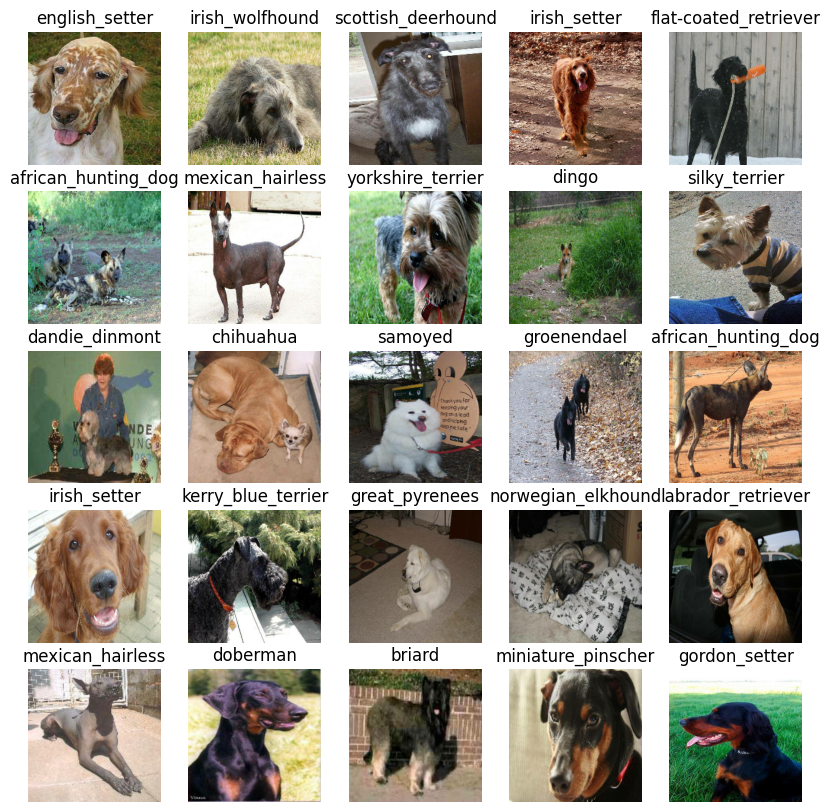

In [35]:
# Now let's visualize our data in the training batch
train_images, train_label = next(training_data.as_numpy_iterator())

show_25_imgs(train_images, train_label)

## Building our model
Before we built our model there are few things we have to define:
- The input shape(our images shape, in the form of tensors) to our model
- The output shape(image labels, in the form of Tensors) of our models.
- The URL of the model we want to use. :- mobilenet_v2 ="https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [36]:
# import tensorflow as tf
# import tensorflow_hub as hub
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import MaxPooling2D, Dense, Flatten, Dropout, Conv2D

# print("TensorFlow:", tf.__version__)
# print("TF Hub:", hub.__version__)
# print("Keras (from TF):", tf.keras.__version__)


In [37]:
# def build_simple_cnn(input_shape, num_classes):
#     model = Sequential([
#         Conv2D(32, (3,3), activation='relu', input_shape=input_shape),
#         MaxPooling2D(),
#         Conv2D(64, (3,3), activation='relu'),
#         MaxPooling2D(),
#         Conv2D(128, (3,3), activation='relu'),
#         MaxPooling2D(),
#         Flatten(),
#         Dense(256, activation='relu'),
#         Dropout(0.5),
#         Dense(num_classes, activation='softmax')
#     ])

#     model.compile(optimizer='adam',
#                   loss='categorical_crossentropy',
#                   metrics=['accuracy'])
#     return model

In [38]:
# model = build_simple_cnn(input_shape=(224, 224, 3), num_classes=len(unique_breeds))
# model.summary()

In [39]:
import tensorflow as tf
import tensorflow_hub as hub

def build_sequential_transfer_model(input_shape=(224,224,3),
                                    num_classes=120,
                                    feature_extractor_url="https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4",
                                    trainable=False):
    """
    Build a Sequential transfer learning model using TensorFlow Hub.

    Args:
        input_shape (tuple): Shape of input images (H, W, C).
        num_classes (int): Number of output classes.
        feature_extractor_url (str): TF Hub feature extractor URL.
        trainable (bool): Whether to fine-tune the feature extractor.

    Returns:
        tf.keras.Sequential: A compiled Keras model using integer labels (sparse_categorical_crossentropy).
    """

    # Load the feature extractor
    feature_extractor_layer = hub.KerasLayer(
        feature_extractor_url,
        input_shape=input_shape,
        trainable=trainable
    )

    # Named function to apply the feature extractor
    def apply_feature_extractor(x):
        return feature_extractor_layer(x)

    # Build the sequential model
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=input_shape),
        tf.keras.layers.Lambda(apply_feature_extractor),
        tf.keras.layers.Dense(num_classes, activation="softmax")
    ])

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


In [40]:
model = build_sequential_transfer_model()
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 153,720 (600.47 KB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 0 (0.00 B)

## Tensorflow callbacks

In [41]:
%load_ext tensorboard
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog-Vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [42]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)

## Trainning our model

In [43]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step: 10 }

In [44]:
def train_model():
  model = build_sequential_transfer_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x=training_data, epochs=NUM_EPOCHS, validation_data = val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  return model

In [45]:
model = train_model()

Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 381s 3s/step - accuracy: 0.3259 - loss: 3.2853 - val_accuracy: 0.7590 - val_loss: 0.9624
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 216s 2s/step - accuracy: 0.8816 - loss: 0.5757 - val_accuracy: 0.7740 - val_loss: 0.7762
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 299s 2s/step - accuracy: 0.9404 - loss: 0.3195 - val_accuracy: 0.7970 - val_loss: 0.6608
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 231s 2s/step - accuracy: 0.9765 - loss: 0.2114 - val_accuracy: 0.8130 - val_loss: 0.6308
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step - accuracy: 0.9828 - loss: 0.1441 - val_accuracy: 0.7980 - val_loss: 0.6125
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 211s 2s/step - accuracy: 0.9929 - loss: 0.1047 - val_accuracy: 0.8070 - val_loss: 0.6083
Epoch 7/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 304s 2s/step - accuracy: 0.9976 - loss: 0.0781 - val_accuracy: 0.8090 - val_loss: 0.5959


In [46]:
%tensorboard --logdir drive/MyDrive/Dog-Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating the prediction using trained model

In [47]:
## We will make the prediction on the validation data
prediction = model.predict(val_data, verbose=1)

32/32 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step


In [48]:
prediction.shape

(1000, 120)

In [49]:
np.max(prediction[0]), np.argmax(prediction[0])

(np.float32(0.991989), np.int64(17))

In [50]:
unique_breeds[np.argmax(prediction[0])]

'border_terrier'

In [51]:
## let's understand the predictions
index = 56
print(prediction[index])
print(f"Max value (probabilty of prediction): {round(np.max(prediction[index]),2)}")
print(f"Index for the Max value: {np.argmax(prediction[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(prediction[index])]}")


[3.24197958e-06 9.74646926e-01 1.21203198e-06 4.01908380e-07
 4.07909595e-10 3.16296989e-10 1.48286858e-08 1.60433828e-07
 3.20617168e-08 3.00882297e-09 6.47623679e-08 1.67129986e-06
 5.93342309e-09 2.12556994e-08 2.01127259e-05 6.21981712e-07
 4.38845618e-08 3.03715031e-09 2.76398623e-05 4.15059773e-08
 1.22041116e-03 3.18247572e-07 2.38991248e-07 2.08251365e-02
 1.10390346e-08 1.92158879e-07 3.20834943e-06 3.08224521e-08
 1.53622977e-06 2.05818895e-09 1.11009889e-07 4.44990832e-07
 2.98845634e-07 2.05927768e-06 4.72777053e-08 1.83498527e-09
 2.29904367e-06 2.11277623e-07 3.79621383e-07 1.27322874e-09
 1.06169518e-05 1.01947080e-06 4.63325094e-08 2.36961162e-09
 1.14126815e-05 2.47554616e-10 2.27581131e-06 1.58696949e-07
 4.61014897e-05 4.18409911e-07 6.87203374e-06 2.39673464e-05
 2.92944691e-07 2.52318042e-08 8.15569656e-05 7.01083014e-09
 3.04279683e-06 1.35391616e-07 7.96602478e-07 2.91831442e-04
 5.01960926e-08 9.61283764e-09 2.13813152e-07 4.47630599e-09
 6.22954133e-07 1.968394

In [52]:
def get_prediction_label(index):
    """
    This function will return the label with probability about how much sure it is about that particular prediction.
    """
    return unique_breeds[np.argmax(prediction[index])], round(max(prediction[index]),2)

In [53]:
print(get_prediction_label(4))


('miniature_schnauzer', np.float32(0.87))


So from the result we can say that in the predictions for the 4 index, it has predicted that it is miniature_schnauzer and its 95% sure about that.

In [54]:
val_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Now since our validation data is still batch dataset we have to still unbatch it to make prediction on the validation images and then compare it to the true lables

In [55]:


def unbatch(data):
  images= []
  labels= []

  # loop through the unbatch data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_label =   unbatch(val_data)


label_ = [label for _, label in val_data.unbatch().as_numpy_iterator()]


In [56]:
val_images[0], val_label[0]

(array([[[0.08661207, 0.09751292, 0.07815619],
         [0.06751302, 0.0918505 , 0.05747823],
         [0.0604112 , 0.09729353, 0.04384629],
         ...,
         [0.83837754, 0.8455904 , 0.79945946],
         [0.7929071 , 0.7970798 , 0.7295842 ],
         [0.8214812 , 0.826038  , 0.75354415]],
 
        [[0.07184874, 0.09509204, 0.08496422],
         [0.06569613, 0.096114  , 0.0656529 ],
         [0.04666601, 0.09603959, 0.03923428],
         ...,
         [0.74699265, 0.75564605, 0.6929895 ],
         [0.72310936, 0.73635286, 0.6507261 ],
         [0.75028026, 0.76419234, 0.67546123]],
 
        [[0.04185049, 0.07891282, 0.07907913],
         [0.03230042, 0.08288307, 0.05734802],
         [0.02757026, 0.09470031, 0.03129049],
         ...,
         [0.65601474, 0.67997307, 0.56799006],
         [0.6598779 , 0.6838362 , 0.57188773],
         [0.68698364, 0.710942  , 0.5989934 ]],
 
        ...,
 
        [[0.326806  , 0.42850253, 0.3172997 ],
         [0.6370607 , 0.7247883 , 0.66578

In [57]:
def print_prediction(index):
    '''
    Function to print prediction vs true label
    '''
    pred_label = unique_breeds[np.argmax(prediction[index])]
    pred_prob  = round(np.max(prediction[index]), 2)
    true_label = unique_breeds[label_[index]]
    print(f"""Image {index}:
    Predicted -> {pred_label} ({pred_prob*100}%),
    True -> {true_label[0]}""")



In [58]:
# Lets Check first 10 images
for i in range(10):
    print_prediction(i)

Image 0: 
    Predicted -> border_terrier (99.0%), 
    True -> border_terrier
Image 1: 
    Predicted -> pomeranian (63.0%), 
    True -> samoyed
Image 2: 
    Predicted -> yorkshire_terrier (39.0%), 
    True -> australian_terrier
Image 3: 
    Predicted -> irish_wolfhound (83.0%), 
    True -> irish_wolfhound
Image 4: 
    Predicted -> miniature_schnauzer (87.0%), 
    True -> miniature_schnauzer
Image 5: 
    Predicted -> giant_schnauzer (65.0%), 
    True -> giant_schnauzer
Image 6: 
    Predicted -> malinois (56.0%), 
    True -> malinois
Image 7: 
    Predicted -> japanese_spaniel (97.0%), 
    True -> japanese_spaniel
Image 8: 
    Predicted -> german_shepherd (90.0%), 
    True -> german_shepherd
Image 9: 
    Predicted -> collie (85.0%), 
    True -> collie


So overall from the resul we can say that,
the model is performing really well. from above 10 results only one got failed.

## Let's visualise those predictions.

In [59]:
def plot_preds(prediction_probabilities, labels, images, n=0):
    """
    View the prediction, ground truth and image for sample n
    """
    pred_prob = prediction_probabilities[n]
    image = images[n]
    true_label = labels[n]

    # Get predicted label and probability
    pred_label = np.argmax(pred_prob)
    pred_label_name = unique_breeds[pred_label]
    pred_confidence = round(np.max(pred_prob)*100, 2)

    # Plot the image
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    if pred_label_name==true_label:
      color = 'green'
    else:
      color = 'red'

    # Title: Predicted, Confidence %, True label
    plt.title(f"Predicted: {pred_label_name} ({pred_confidence}%), True: {true_label}", color=color)
    plt.show()

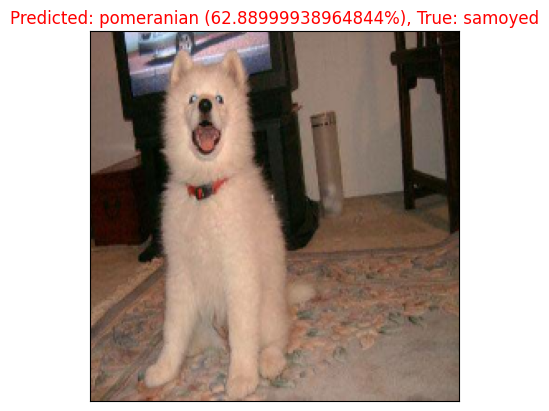

In [60]:
plot_preds(prediction_probabilities=prediction,
           labels=val_label,
           images=val_images, n=1)

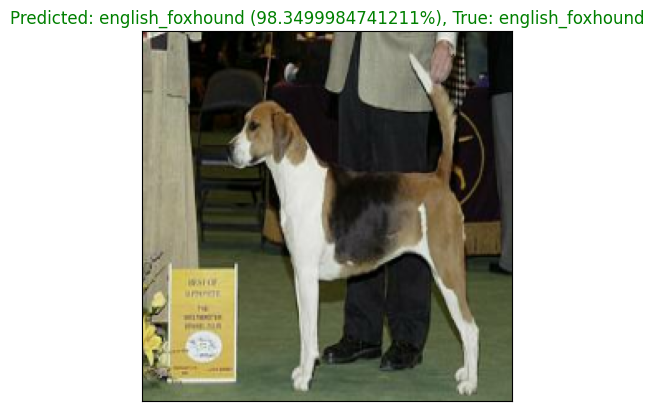

In [61]:
plot_preds(prediction_probabilities=prediction,
           labels=val_label,
           images=val_images, n=79)

# Lets make a function to visualise the top 10 prediction for 1 particular dog breed or 1 dog image.

In [62]:
import matplotlib.pyplot as plt
import numpy as np

def plot_pred_conf(pred_probs, labels, n=0):
    """
    Plot top 10 predicted classes and probabilities for a single image n.
    Highlights true label in green if present in top 10.
    """
    pred_prob = pred_probs[n]
    true_label = labels[n]

    # top 10 predictions
    top10_idx = pred_prob.argsort()[-10:][::-1]
    top10_values = pred_prob[top10_idx]
    top10_labels = unique_breeds[top10_idx]

    # setup bar plot
    bars = plt.bar(np.arange(len(top10_labels)), top10_values, color="grey")
    plt.xticks(np.arange(len(top10_labels)), labels=top10_labels, rotation='vertical')
    plt.ylabel("Probability")
    plt.title(f"Top 10 Predictions (Image {n})")

    # highlight true label if present
    if true_label in top10_labels:
        bars[np.argmax(top10_labels == true_label)].set_color("green")

    plt.show()


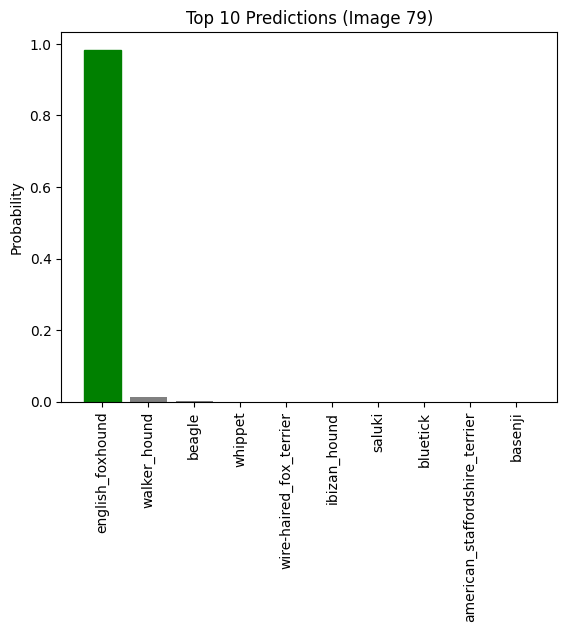

In [63]:
plot_pred_conf(pred_probs=prediction, labels = val_label, n=79)

In [64]:
def save_model(model, suffix=None):
    """
    Save a TensorFlow model in native Keras format.
    """
    model_dir = "drive/MyDrive/Dog-Vision/models"
    os.makedirs(model_dir, exist_ok=True)

    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    if suffix:
        model_path = os.path.join(model_dir, f"{timestamp}-{suffix}.keras")
    else:
        model_path = os.path.join(model_dir, f"{timestamp}.keras")

    print(f"Saving model to: {model_path}...")
    model.save(model_path)  # native Keras format
    print("Done!")

In [65]:
import keras
def load_model(model_path):
    keras.config.enable_unsafe_deserialization()
    """
    Load a saved Keras model (with TensorFlow Hub layers) from disk.
    """
    print(f"Loading model from: {model_path}")

    model = tf.keras.models.load_model(
        model_path,
        custom_objects={"KerasLayer": hub.KerasLayer}
    )

    return model

In [66]:
save_model(model, suffix="5000-images-mobileNetV2-Adam")

Saving model to: drive/MyDrive/Dog-Vision/models/20250822-160839-5000-images-mobileNetV2-Adam.keras...
Done!


In [67]:
load_5000_image_model2 = load_model('/content/drive/MyDrive/Dog-Vision/models/20250822-125926-5000-images-mobileNetV2-Adam.keras')

Loading model from: /content/drive/MyDrive/Dog-Vision/models/20250822-125926-5000-images-mobileNetV2-Adam.keras


In [68]:
model.evaluate(val_data)

32/32 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.8121 - loss: 0.5767


[0.5958881378173828, 0.8090000152587891]

In [69]:
# load_5000_image_model2.evaluate(val_data)

In [70]:
# CREATE A MODEL FOR FULL DATA

full_data = create_data_batches(X, Y)

Creating training batches...


In [71]:
full_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
full_model = build_sequential_transfer_model()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [73]:
# create full model callbacks
full_model_callbacks = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

In [75]:
full_model.fit(x=full_data, epochs=NUM_EPOCHS,callbacks=[full_model_callbacks, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 464s 1s/step - accuracy: 0.9992 - loss: 0.0104
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 435s 1s/step - accuracy: 0.9992 - loss: 0.0092
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 436s 1s/step - accuracy: 0.9994 - loss: 0.0081
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 429s 1s/step - accuracy: 0.9986 - loss: 0.0095


In [76]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog-Vision/models/20250822-185155-full-image-set-mobilenetv2-Adam.keras...
Done!


## Making Prediction on the test dataset.
To make predictions on the test dataset we will
* Get the test image filename
* Convert the filename into test data batches
* Make the prediction array by passing the test batches to the predict() method call on our model.

In [87]:
test_path = '/content/drive/MyDrive/Dog-Vision/test'
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/Dog-Vision/test/e380bd4f8375d09ae72f4f36aa610031.jpg',
 '/content/drive/MyDrive/Dog-Vision/test/e6f07d64c2380bbde03a7b6ade01b859.jpg',
 '/content/drive/MyDrive/Dog-Vision/test/e7340d1efa70bf6d6c134e1e150f9473.jpg',
 '/content/drive/MyDrive/Dog-Vision/test/def639bab46dfc714234180be730ef49.jpg',
 '/content/drive/MyDrive/Dog-Vision/test/e406358fe35be30ac65f11936c2a066e.jpg']

In [88]:
len(test_filenames)

10357

In [93]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [94]:
test_data

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [96]:
test_predictions = full_model.predict(test_data,
                                             verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 718s 2s/step


In [97]:
# Check out the test predictions
test_predictions[:10]

array([[3.03081720e-08, 4.26958913e-09, 4.79092606e-08, ...,
        9.98328687e-07, 2.12242405e-04, 1.03081248e-07],
       [2.92825712e-06, 9.09930497e-14, 4.59487959e-09, ...,
        3.69995541e-06, 1.18794297e-11, 2.66565503e-09],
       [1.45384377e-07, 5.60959688e-06, 1.12201874e-08, ...,
        1.15015686e-08, 3.98045381e-11, 6.37402409e-10],
       ...,
       [3.04594350e-10, 7.17379822e-10, 5.79895207e-08, ...,
        5.56451196e-09, 6.44481968e-10, 5.51422339e-08],
       [7.15874471e-10, 9.54142632e-09, 1.96127070e-09, ...,
        1.66329961e-09, 1.65533054e-09, 2.41703422e-08],
       [5.61730512e-13, 4.08391756e-08, 6.98998082e-10, ...,
        1.93506585e-05, 9.66688752e-13, 7.77828291e-09]], dtype=float32)

In [98]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [100]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/Dog-Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e380bd4f8375d09ae72f4f36aa610031,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6f07d64c2380bbde03a7b6ade01b859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7340d1efa70bf6d6c134e1e150f9473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,def639bab46dfc714234180be730ef49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e406358fe35be30ac65f11936c2a066e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e380bd4f8375d09ae72f4f36aa610031,3.030817e-08,4.269589e-09,4.790926e-08,5.713818e-10,4.483471e-08,5.763302e-10,1.181326e-06,6.958615e-08,8.526889e-10,...,1.987472e-09,1.218193e-04,3.205971e-12,3.578717e-12,1.498647e-08,8.089582e-08,6.844852e-04,9.983287e-07,2.122424e-04,1.030812e-07
1,e6f07d64c2380bbde03a7b6ade01b859,2.928257e-06,9.099305e-14,4.594880e-09,6.798813e-13,1.593340e-04,1.620335e-11,7.586689e-14,1.440272e-09,1.050382e-11,...,4.473207e-10,9.417495e-09,1.618851e-08,1.393772e-10,5.663021e-09,1.038966e-12,1.562002e-10,3.699955e-06,1.187943e-11,2.665655e-09
2,e7340d1efa70bf6d6c134e1e150f9473,1.453844e-07,5.609597e-06,1.122019e-08,1.351215e-08,3.184181e-09,2.820015e-06,9.225321e-09,3.347460e-09,1.127072e-09,...,4.618546e-10,3.958469e-10,3.163429e-09,3.641087e-08,1.245477e-09,6.931596e-09,1.564855e-10,1.150157e-08,3.980454e-11,6.374024e-10
3,def639bab46dfc714234180be730ef49,2.748204e-08,1.639920e-11,3.583094e-09,8.602932e-15,2.563571e-13,3.194448e-12,6.279288e-12,1.093741e-09,3.472514e-14,...,2.578539e-08,3.846624e-12,6.627559e-12,1.230697e-14,6.252145e-09,5.356659e-15,1.374358e-08,2.161488e-08,1.254583e-13,2.288781e-08
4,e406358fe35be30ac65f11936c2a066e,2.570194e-09,1.754846e-11,4.888328e-11,2.516990e-05,1.247885e-07,1.825917e-05,5.145172e-07,3.081725e-05,2.134645e-10,...,1.788220e-09,1.143040e-03,1.287161e-07,4.947580e-06,3.126805e-06,2.432209e-09,1.240297e-09,2.490954e-07,5.218654e-08,3.421207e-06


In [102]:
preds_df.to_csv("drive/My Drive/Dog-Vision/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Let's try to make this prediction on our own pics and see what we get.

In [137]:
# Get custom image filepaths (safe join + filter)
custom_path = "drive/MyDrive/Dog-Vision/CustomPics/"
custom_image_paths = [
    os.path.join(custom_path, fname)
    for fname in os.listdir(custom_path)
    if fname.lower().endswith((".jpg", ".jpeg", ".png"))
]

In [138]:
print("Custom images:", custom_image_paths)

Custom images: ['drive/MyDrive/Dog-Vision/CustomPics/Alaskan-Malamute.jpg', 'drive/MyDrive/Dog-Vision/CustomPics/german-shepherd.jpg', 'drive/MyDrive/Dog-Vision/CustomPics/Golden.jpg', 'drive/MyDrive/Dog-Vision/CustomPics/german-shepherd-2.jpg']


In [139]:
# Turn custom image into batch (no labels → test_data=True)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [140]:
# Make predictions
custom_preds = full_model.predict(custom_data, verbose=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


In [141]:
custom_preds

array([[3.31885652e-09, 4.99185582e-10, 2.26781918e-08, 2.28980127e-10,
        8.17582890e-09, 2.39596875e-06, 6.52125798e-10, 1.54954341e-06,
        4.05667618e-11, 1.65266574e-08, 1.19291554e-09, 2.71962023e-07,
        3.51397977e-09, 4.33311733e-08, 1.07591165e-10, 1.78099438e-10,
        5.69321967e-09, 2.93986030e-10, 2.37676886e-07, 1.17005712e-08,
        1.22675159e-09, 6.76917244e-10, 4.47524212e-10, 8.92066776e-09,
        1.79979226e-11, 4.02064299e-10, 3.12266185e-10, 1.21848132e-07,
        1.36344136e-09, 1.22685805e-07, 8.75186998e-08, 2.82266810e-09,
        1.32423725e-10, 4.28295550e-07, 1.36526621e-08, 4.13450003e-08,
        6.35389630e-10, 2.61641864e-09, 1.59418718e-07, 3.10471004e-09,
        2.82931945e-09, 1.19796422e-08, 1.21561941e-10, 3.68560641e-03,
        2.96720213e-08, 7.23257685e-08, 8.76041995e-08, 6.12815299e-10,
        2.49282834e-07, 4.41988703e-08, 2.69850337e-10, 1.31438691e-08,
        8.72189389e-07, 1.89344457e-10, 2.72974376e-07, 3.301600

In [142]:
def get_prediction_label(prediction_probs):
    """
    Takes a prediction probability array and returns the predicted label
    with its confidence.
    """
    pred_index = np.argmax(prediction_probs)  # index of max probability
    pred_label = unique_breeds[pred_index]    # map index to label
    confidence = round(float(np.max(prediction_probs)), 2)
    return pred_label, confidence

In [143]:
custom_pred_labels = [get_prediction_label(p) for p in custom_preds]

In [144]:
custom_pred_labels

[('malamute', 0.99),
 ('malinois', 1.0),
 ('golden_retriever', 0.94),
 ('german_shepherd', 0.99)]

In [145]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

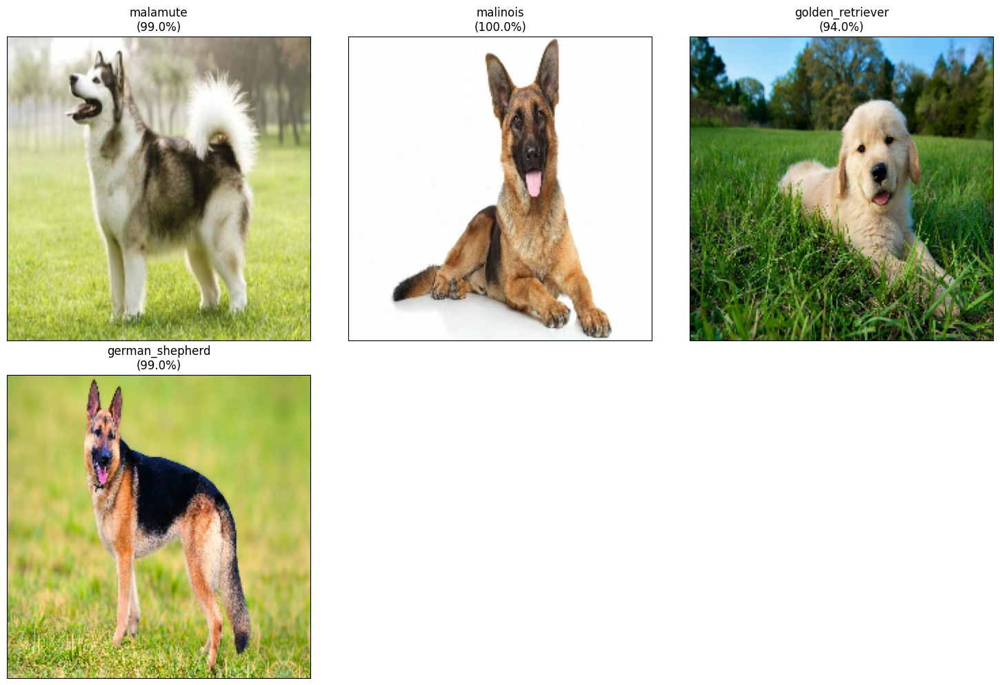

In [146]:
import math

n_images = len(custom_images)
cols = 3
rows = math.ceil(n_images / cols)

plt.figure(figsize=(15, rows * 5))

for i, image in enumerate(custom_images):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    label, conf = custom_pred_labels[i]
    plt.title(f"{label}\n({conf*100:.1f}%)")

plt.tight_layout()
plt.show()

## There we go boom...